In [1]:
# Import required libraries
import os
import uuid
from datetime import datetime

import requests
from pydantic import BaseModel, Field

# For OpenAI API (optional)
try:
    import openai

    OPENAI_AVAILABLE = True
except ImportError:
    OPENAI_AVAILABLE = False
    print("OpenAI library not installed. Install with: pip install openai")

# For image display in notebook
try:
    from IPython.display import HTML, Image, display

    IPYTHON_AVAILABLE = True
except ImportError:
    IPYTHON_AVAILABLE = False
    print("IPython not available. Image display will be limited.")

In [ ]:
class KidProfile(BaseModel):
    """Profile of a child for gift recommendation."""

    id: str = Field(default_factory=lambda: str(uuid.uuid4()))
    name: str
    age: int = Field(gt=0, le=18, description="Age must be between 1 and 18")
    wishlist: list[str] = Field(default_factory=list, description="List of items the kid wants")


class GiftRecommendation(BaseModel):
    """Gift recommendation generated by LLM."""

    id: str = Field(default_factory=lambda: str(uuid.uuid4()))
    kid_id: str
    gifts: list[str] = Field(description="List of recommended gifts")
    rationale: str = Field(description="Explanation for the recommendations")
    model_version: str = Field(description="Version of the model used")


class Wish(BaseModel):
    """Personalized holiday wish generated by LLM."""

    id: str = Field(default_factory=lambda: str(uuid.uuid4()))
    kid_id: str
    text: str = Field(description="Personalized wish text")
    model_version: str = Field(description="Version of the model used")


class CardImage(BaseModel):
    """Generated card image."""

    id: str = Field(default_factory=lambda: str(uuid.uuid4()))
    kid_id: str
    image_url: str = Field(description="URL or path to the generated image")
    model_version: str = Field(description="Version of the image model used")
    prompt: str | None = Field(default=None, description="Prompt used for image generation")


class GiftCard(BaseModel):
    """Complete gift card with all components."""

    id: str = Field(default_factory=lambda: str(uuid.uuid4()))
    kid_id: str
    recommendation_id: str
    wish_id: str
    image_id: str
    rendered_url: str | None = Field(default=None, description="URL to rendered HTML/PDF card")
    status: str = Field(default="pending", description="Status: pending, completed, failed")

In [3]:
class LLMClient:
    """Client for OpenAI-compatible LLM services."""

    def __init__(self, base_url: str, api_key: str | None = None, model: str = "gpt-3.5-turbo"):
        """
        Initialize LLM client.

        Args:
            base_url: Base URL for the LLM service (e.g., "https://api.openai.com/v1" or "http://localhost:8000/v1")
            api_key: API key (required for OpenAI, optional for local vLLM)
            model: Model name to use
        """
        self.base_url = base_url.rstrip("/")
        self.api_key = api_key
        self.model = model
        self.model_version = f"{model}-{datetime.now().strftime('%Y%m%d')}"

    def generate(self, prompt: str, temperature: float = 0.7, max_tokens: int = 500) -> str:
        """
        Generate text using the LLM service.

        Args:
            prompt: Input prompt
            temperature: Sampling temperature (0.0 to 2.0)
            max_tokens: Maximum tokens to generate

        Returns:
            Generated text

        Raises:
            ValueError: If the API call fails
        """
        headers = {"Content-Type": "application/json"}

        if self.api_key:
            headers["Authorization"] = f"Bearer {self.api_key}"

        # Check if using OpenAI API format or vLLM format
        if "openai.com" in self.base_url or OPENAI_AVAILABLE:
            # OpenAI-compatible format
            payload = {
                "model": self.model,
                "messages": [{"role": "user", "content": prompt}],
                "temperature": temperature,
                "max_tokens": max_tokens,
            }
            endpoint = f"{self.base_url}/chat/completions"
        else:
            # vLLM format (simplified)
            payload = {"prompt": prompt, "temperature": temperature, "max_tokens": max_tokens}
            endpoint = f"{self.base_url}/generate"

        try:
            response = requests.post(endpoint, headers=headers, json=payload, timeout=60)
            response.raise_for_status()
            data = response.json()

            # Extract text from response
            if "openai.com" in self.base_url or "choices" in data:
                return data["choices"][0]["message"]["content"].strip()
            elif "text" in data:
                return data["text"].strip()
            else:
                raise ValueError(f"Unexpected response format: {data}")

        except requests.exceptions.RequestException as e:
            raise ValueError(f"LLM API call failed: {str(e)}")

In [4]:
class ImageClient:
    """Client for Recraft image generation API."""

    def __init__(
        self,
        api_key: str | None = None,
        base_url: str = "https://external.api.recraft.ai/v1",
        model: str = "recraftv3",
    ):
        """
        Initialize Recraft image generation client.

        Args:
            api_key: Recraft API key (required, or set RECRAFT_API_KEY env var)
            base_url: Base URL for Recraft API (default: https://external.api.recraft.ai/v1)
            model: Model name to use (default: "recraftv3")
        """
        if not api_key:
            api_key = os.getenv("RECRAFT_API_KEY", "").strip()

        if not api_key:
            raise ValueError(
                "Recraft API key is required. "
                "Set RECRAFT_API_KEY environment variable or pass api_key parameter."
            )

        if not OPENAI_AVAILABLE:
            raise ValueError(
                "OpenAI library is required for Recraft API. Install with: pip install openai"
            )

        self.client = openai.OpenAI(base_url=base_url, api_key=api_key)
        self.model = model
        self.model_version = f"{model}-{datetime.now().strftime('%Y%m%d')}"

    def generate(
        self,
        prompt: str,
        style: str = "digital_illustration",
        model: str | None = None,
        size: str | None = None,
        extra_body: dict | None = None,
    ) -> str:
        """
        Generate an image using Recraft API.

        Args:
            prompt: Image generation prompt
            style: Style for the image (e.g., "digital_illustration", "realistic_image")
            model: Model to use (defaults to instance model, typically "recraftv3")
            size: Image size in format "WIDTHxHEIGHT" (e.g., "1024x1024", "1280x1024")
            extra_body: Additional parameters (e.g., {"substyle": "hand_drawn"})

        Returns:
            URL of the generated image

        Raises:
            ValueError: If image generation fails
        """
        try:
            # Build parameters
            params = {
                "prompt": prompt,
                "style": style,
            }

            # Add optional parameters
            if model is not None:
                params["model"] = model
            elif self.model:
                params["model"] = self.model

            if size is not None:
                params["size"] = size

            if extra_body is not None:
                params["extra_body"] = extra_body

            # Generate image
            response = self.client.images.generate(**params)

            # Extract image URL
            if hasattr(response, "data") and len(response.data) > 0:
                return response.data[0].url
            else:
                raise ValueError(f"Unexpected response format: {response}")

        except Exception as e:
            error_msg = f"Recraft API call failed: {str(e)}"
            if "authentication" in str(e).lower() or "api key" in str(e).lower():
                error_msg += "\n   → Check that your RECRAFT_API_KEY is correct and not expired"
            elif "quota" in str(e).lower() or "balance" in str(e).lower():
                error_msg += "\n   → Check your Recraft API units balance"
            raise ValueError(error_msg)

In [5]:
def test_recraft_image_client(image_client: ImageClient) -> None:
    """
    Test Recraft ImageClient with examples from Recraft documentation.

    Args:
        image_client: Initialized ImageClient instance
    """
    print("🧪 Testing Recraft ImageClient...\n")

    # Test 1: Basic generation with style and model
    print("Test 1: Basic generation (style='digital_illustration', model='recraftv3')")
    try:
        response_url = image_client.generate(
            prompt="two race cars on a track", style="digital_illustration", model="recraftv3"
        )
        print(f"✅ Success! Image URL: {response_url}")
        if IPYTHON_AVAILABLE:
            display(Image(url=response_url, width=400))
    except Exception as e:
        print(f"❌ Failed: {str(e)}")

    print("\n" + "-" * 80 + "\n")

    # Test 2: Generation with custom size
    print("Test 2: Generation with custom size (style='realistic_image', size='1280x1024')")
    try:
        response_url = image_client.generate(
            prompt="red point siamese cat", style="realistic_image", size="1280x1024"
        )
        print(f"✅ Success! Image URL: {response_url}")
        if IPYTHON_AVAILABLE:
            display(Image(url=response_url, width=400))
    except Exception as e:
        print(f"❌ Failed: {str(e)}")

    print("\n" + "-" * 80 + "\n")

    print("\n" + "=" * 80)
    print("✅ All tests completed!")

In [6]:
def generate_gift_recommendation(
    llm_client: LLMClient, kid_profile: KidProfile
) -> GiftRecommendation:
    """
    Generate gift recommendations for a kid using LLM.

    Args:
        llm_client: Initialized LLM client
        kid_profile: Profile of the kid

    Returns:
        GiftRecommendation with recommended gifts and rationale
    """
    #     prompt = f"""You are Santa's gift recommendation assistant. Based on the following kid profile, recommend 3-5 age-appropriate gifts.

    # Kid Profile:
    # - Name: {kid_profile.name}
    # - Age: {kid_profile.age}
    # - Wishlist: {', '.join(kid_profile.wishlist) if kid_profile.wishlist else 'No specific items listed'}

    # Please provide:
    # 1. A list of 3-5 recommended gifts (one per line, starting with "-")
    # 2. A brief rationale explaining why these gifts are suitable for this child

    # Format your response as:
    # GIFTS:
    # - Gift 1
    # - Gift 2
    # - Gift 3

    # RATIONALE:
    # [Your explanation here]"""

    prompt = f"""You are Santa’s magical gift recommendation assistant. Based on the child’s profile, recommend 3–5 thoughtful, age-appropriate gifts that feel personal, imaginative, and exciting.

Kid Profile:
- Name: {kid_profile.name}
- Age: {kid_profile.age}
- Wishlist: {", ".join(kid_profile.wishlist) if kid_profile.wishlist else "No specific items listed"}

Your task:
1. Recommend 1-3 gifts (one short phrase each).
2. Each gift must be age-appropriate, safe, and appealing for a child of this age.
3. Take inspiration from the child’s wishlist, but avoid repeating it unless it is genuinely relevant.
4. Ensure the gifts are fun, creative, and suitable for Santa to give.
5. After the list, provide a warm, concise rationale (2–3 sentences) explaining why these gifts match the child’s interests and age.

Format your answer EXACTLY like this:

GIFTS:
- Gift 1
- Gift 2
- Gift 3

RATIONALE:
[2–3 sentence explanation]
"""

    response = llm_client.generate(prompt=prompt, temperature=0.8, max_tokens=300)

    # Parse response to extract gifts and rationale
    lines = response.split("\n")
    gifts = []
    rationale = ""
    in_gifts_section = False
    in_rationale_section = False

    for line in lines:
        line = line.strip()
        if not line:
            continue

        if line.upper().startswith("GIFTS"):
            in_gifts_section = True
            in_rationale_section = False
            continue
        elif line.upper().startswith("RATIONALE"):
            in_rationale_section = True
            in_gifts_section = False
            continue

        if in_gifts_section and line.startswith("-"):
            gift = line[1:].strip()
            if gift:
                gifts.append(gift)
        elif in_rationale_section:
            rationale += line + " "

    # Fallback: if parsing failed, try to extract gifts from lines starting with "-"
    if not gifts:
        for line in lines:
            if line.strip().startswith("-"):
                gift = line.strip()[1:].strip()
                if gift:
                    gifts.append(gift)

    # If still no gifts, use the first few sentences as gifts
    if not gifts:
        sentences = response.split(".")
        gifts = [s.strip() for s in sentences[:3] if s.strip()]

    # Use remaining text as rationale if not found
    if not rationale.strip():
        rationale = response

    return GiftRecommendation(
        kid_id=kid_profile.id,
        gifts=gifts[:5],  # Limit to 5 gifts
        rationale=rationale.strip(),
        model_version=llm_client.model_version,
    )

In [7]:
def generate_wish(
    llm_client: LLMClient, kid_profile: KidProfile, gift_recommendation: GiftRecommendation
) -> Wish:
    """
    Generate a personalized holiday wish for a kid.

    Args:
        llm_client: Initialized LLM client
        kid_profile: Profile of the kid
        gift_recommendation: Previously generated gift recommendation

    Returns:
        Wish with personalized text
    """
    #     prompt = f"""You are Santa Claus writing a personalized holiday message to a child. Write a warm, age-appropriate, and magical holiday wish.

    # Kid Profile:
    # - Name: {kid_profile.name}
    # - Age: {kid_profile.age}

    # Recommended Gifts:
    # {chr(10).join(f"- {gift}" for gift in gift_recommendation.gifts)}

    # Write a personalized holiday wish (2-4 sentences) that:
    # 1. Addresses the child by name
    # 2. Mentions their age appropriately
    # 3. References the recommended gifts in a natural way
    # 4. Is warm, magical, and suitable for the holiday season
    # 5. Ends with a signature "Merry Christmas!"

    # Write only the wish text, nothing else."""
    prompt = f"""
    You are Santa Claus writing a warm, magical, and age-appropriate holiday message to a child.

Kid Profile:
- Name: {kid_profile.name}
- Age: {kid_profile.age}

Recommended Gifts:
{chr(10).join(f"- {gift}" for gift in gift_recommendation.gifts)}

Write a personalized holiday wish that:
1. Addresses the child by name.
2. Mentions their age in a natural, encouraging way.
3. References the recommended gifts subtly and magically (no listing, no forced enumeration).
4. Uses a warm, gentle Santa tone that feels joyful and kind.
5. Contains 2–4 sentences.
6. Does NOT include Santa’s last name.
7. Ends with “Merry Christmas!” as the final sentence.

Write only the wish text. No prefixes, no labels, no formatting.

    """

    response = llm_client.generate(prompt=prompt, temperature=0.9, max_tokens=200)

    return Wish(
        kid_id=kid_profile.id, text=response.strip(), model_version=llm_client.model_version
    )

In [8]:
def generate_card_image(
    image_client: ImageClient, kid_profile: KidProfile, gift_recommendation: GiftRecommendation
) -> CardImage:
    """
    Generate a card image based on kid profile and gift recommendations.

    Args:
        image_client: Initialized image generation client
        kid_profile: Profile of the kid
        gift_recommendation: Previously generated gift recommendation

    Returns:
        CardImage with generated image URL
    """
    # Create a prompt for image generation
    main_gift = gift_recommendation.gifts[0] if gift_recommendation.gifts else "birthday gift"

    #     prompt = f"""A magical, festive holiday card illustration featuring:
    # - A cheerful, age-appropriate scene for a {kid_profile.age}-year-old child
    # - A {main_gift} in the center of the image
    # - Holiday decorations: Christmas tree, snow, presents, stars
    # - Warm, colorful, and joyful atmosphere
    # - Suitable for a holiday gift card
    # - Style: whimsical, child-friendly, magical
    # - No text in the image"""

    prompt = f"""
    A magical, festive Christmas postcard illustration featuring:
- A joyful, whimsical holiday scene suitable for a child
- The central item: a {main_gift} (shown as a magical, beautifully illustrated object)
- A cheerful, fictional child character (no resemblance to real people) admiring or interacting with the gift
- Bright Christmas decorations: trees, ornaments, presents, snow, twinkling lights, stars
- Warm, vibrant, colorful atmosphere with a magical glow
- Whimsical, storybook-style art appropriate for a children’s holiday card
- Soft lighting, sparkles, and a sense of wonder
- No text, signatures, or writing anywhere in the image
- No copyrighted characters

Style:
- Child-friendly, illustrated, magical
- Clean, centered composition suitable for a printed holiday card
    """

    # Use digital_illustration style with hand_drawn substyle for child-friendly look
    image_url = image_client.generate(
        prompt=prompt,
        style="digital_illustration",
        size="1024x1434",
        extra_body={"substyle": "hand_drawn"},
    )

    return CardImage(
        kid_id=kid_profile.id,
        image_url=image_url,
        model_version=image_client.model_version,
        prompt=prompt,
    )


## Configuration

In [9]:
import getpass


def set_env_var_secret(env_var_name: str, min_length: int = 5, rewrite: bool = False):
    existing = os.getenv(env_var_name)
    if existing and not rewrite:
        return f"{env_var_name} already set"

    secret = getpass.getpass(f"{env_var_name}: ").strip()

    if len(secret) < min_length:
        raise ValueError("Secret is too short.")
    os.environ[env_var_name] = secret

    return f"Set a new {env_var_name} secret"

In [10]:
set_env_var_secret("OPENAI_API_KEY")

'OPENAI_API_KEY already set'

In [11]:
# Configuration
# Option 1: Use OpenAI API
USE_OPENAI = True  # Set to True to use OpenAI API
OPENAI_API_KEY = os.getenv("OPENAI_API_KEY", "")
OPENAI_MODEL = "gpt-3.5-turbo"

# Option 2: Use local vLLM server
VLLM_BASE_URL = "http://localhost:8000/v1"
VLLM_MODEL = "meta-llama/Llama-2-7b-chat-hf"  # Adjust based on your vLLM setup

# Option 3: Use another OpenAI-compatible API
CUSTOM_LLM_URL = None  # e.g., "https://api.example.com/v1"
CUSTOM_LLM_KEY = None


# Initialize clients
if USE_OPENAI and OPENAI_AVAILABLE and OPENAI_API_KEY:
    llm_client = LLMClient(
        base_url="https://api.openai.com/v1", api_key=OPENAI_API_KEY, model=OPENAI_MODEL
    )
    print(f"✅ Using OpenAI API with model: {OPENAI_MODEL}")
elif CUSTOM_LLM_URL:
    llm_client = LLMClient(base_url=CUSTOM_LLM_URL, api_key=CUSTOM_LLM_KEY, model="custom-model")
    print(f"✅ Using custom LLM service: {CUSTOM_LLM_URL}")
else:
    # Default to local vLLM
    llm_client = LLMClient(base_url=VLLM_BASE_URL, api_key=None, model=VLLM_MODEL)
    print(f"✅ Using local vLLM server: {VLLM_BASE_URL}")
    print("   (Make sure vLLM is running: bash models/llm/start_vllm.sh)")

# # Initialize image client
# image_client = ImageClient(
#     base_url=IMAGE_SERVICE_URL,
#     api_key=IMAGE_SERVICE_KEY,
#     model="stable-diffusion"
# )
# print(f"✅ Image client initialized (placeholder mode: {IMAGE_SERVICE_URL is None})")

✅ Using OpenAI API with model: gpt-3.5-turbo


In [12]:
set_env_var_secret("RECRAFT_API_KEY")

'RECRAFT_API_KEY already set'

In [13]:
# Image generation configuration
USE_RECRAFT = True  # Set to True to use Recraft API
RECRAFT_API_KEY = os.getenv("RECRAFT_API_KEY", "").strip()
RECRAFT_MODEL = "recraftv2"  # Recraft model version

# Alternative: Use other image services
IMAGE_SERVICE_URL = None  # e.g., "https://api.stablediffusion.com/v1"
IMAGE_SERVICE_KEY = None
IMAGE_SERVICE_TYPE = "generic"  # "recraft", "generic", or "placeholder"

# Initialize image client
if USE_RECRAFT and RECRAFT_API_KEY:
    try:
        image_client = ImageClient(api_key=RECRAFT_API_KEY, model=RECRAFT_MODEL)
        print("✅ Image client initialized with Recraft API")
        print(f"   Model: {RECRAFT_MODEL}")
        print("   Base URL: https://external.api.recraft.ai/v1")
    except ValueError as e:
        print(f"❌ Failed to initialize Recraft client: {str(e)}")
        print("   → Creating placeholder client instead")
        image_client = None
else:
    image_client = None
    print("⚠️  Image client not initialized")
    print("   → Set USE_RECRAFT=True and RECRAFT_API_KEY to use Recraft API")

✅ Image client initialized with Recraft API
   Model: recraftv2
   Base URL: https://external.api.recraft.ai/v1


In [14]:
def test_recraft_image_client(image_client: ImageClient) -> None:
    """
    Test Recraft ImageClient with examples from Recraft documentation.

    Args:
        image_client: Initialized ImageClient instance
    """
    print("🧪 Testing Recraft ImageClient...\n")

    # Test 1: Basic generation with style and model
    # print("Test 1: Basic generation (style='digital_illustration', model='recraftv3')")
    # try:
    #     response_url = image_client.generate(
    #         prompt='two race cars on a track',
    #         style='digital_illustration',
    #         model='recraftv3'
    #     )
    #     print(f"✅ Success! Image URL: {response_url}")
    #     if IPYTHON_AVAILABLE:
    #         display(Image(url=response_url, width=400))
    # except Exception as e:
    #     print(f"❌ Failed: {str(e)}")

    # print("\n" + "-"*80 + "\n")

    # Test 2: Generation with custom size
    print("Test 2: Generation with custom size (style='realistic_image', size='1280x1024')")
    try:
        response_url = image_client.generate(
            prompt="""A magical, festive holiday card illustration featuring:
- A cheerful, age-appropriate scene for a 10-year-old child
- An plane in the center of the image (the wished gift)
- Holiday decorations: Christmas tree, snow, presents, stars
- Warm, colorful, and joyful atmosphere
- Suitable for a holiday gift card
- Style: whimsical, child-friendly, magical
- No text in the image""",
            # style='realistic_image',
            size="1024x1434",
        )
        print(f"✅ Success! Image URL: {response_url}")
        if IPYTHON_AVAILABLE:
            display(Image(url=response_url, width=400))
    except Exception as e:
        print(f"❌ Failed: {str(e)}")

    print("\n" + "-" * 80 + "\n")

    print("\n" + "=" * 80)
    print("✅ All tests completed!")


test_recraft_image_client(image_client)

🧪 Testing Recraft ImageClient...

Test 2: Generation with custom size (style='realistic_image', size='1280x1024')
✅ Success! Image URL: https://img.recraft.ai/zR16tnXqOV-RlFhgsnGfv0klveRN4lQ1bbg_fDEnXmI/rs:fit:1024:1434:0/raw:1/plain/abs://external/images/30bcadcb-122a-47bf-a71f-22e1dc3a27b9



--------------------------------------------------------------------------------


✅ All tests completed!


In [15]:
# Sample kid profiles for testing
sample_kids = [
    KidProfile(name="Emma", age=7, wishlist=["doll", "art supplies", "books"]),
    KidProfile(name="Lucas", age=10, wishlist=["LEGO set", "video games", "bicycle"]),
    KidProfile(name="Sophia", age=5, wishlist=["princess dress", "stuffed animals"]),
    KidProfile(name="Noah", age=12, wishlist=["basketball", "headphones", "science kit"]),
]

print(f"Created {len(sample_kids)} sample kid profiles:")
for kid in sample_kids:
    print(f"  - {kid.name}, age {kid.age}, wishes: {', '.join(kid.wishlist)}")

Created 4 sample kid profiles:
  - Emma, age 7, wishes: doll, art supplies, books
  - Lucas, age 10, wishes: LEGO set, video games, bicycle
  - Sophia, age 5, wishes: princess dress, stuffed animals
  - Noah, age 12, wishes: basketball, headphones, science kit


In [16]:
# Generate gift recommendations for all kids
recommendations = []

for kid in sample_kids:
    print(f"\n🎁 Generating gift recommendations for {kid.name} (age {kid.age})...")
    try:
        recommendation = generate_gift_recommendation(llm_client=llm_client, kid_profile=kid)
        recommendations.append(recommendation)
        print(f"✅ Generated {len(recommendation.gifts)} recommendations:")
        for gift in recommendation.gifts:
            print(f"   - {gift}")
        print(f"   Rationale: {recommendation.rationale[:100]}...")
    except Exception as e:
        print(f"❌ Error: {str(e)}")

print(f"\n📊 Generated {len(recommendations)} gift recommendations")


🎁 Generating gift recommendations for Emma (age 7)...
✅ Generated 3 recommendations:
   - DIY bracelet making kit
   - Storybook with blank pages for Emma to illustrate
   - Dress-up costume set
   Rationale: These gifts cater to Emma's interests in art and creativity, allowing her to express herself through...

🎁 Generating gift recommendations for Lucas (age 10)...
✅ Generated 3 recommendations:
   - Science experiment kit
   - Adventure book series
   - Outdoor exploration kit
   Rationale: Lucas is at an age where he is curious and loves to explore. A science experiment kit will engage hi...

🎁 Generating gift recommendations for Sophia (age 5)...
✅ Generated 3 recommendations:
   - Enchanted Fairy Garden Playset
   - Dress-Up Trunk with Princess Costumes
   - Plush Unicorn Toy
   Rationale: Sophia loves princesses and imaginative play, so an Enchanted Fairy Garden Playset will allow her to...

🎁 Generating gift recommendations for Noah (age 12)...
✅ Generated 3 recommendations:
 

In [17]:
recommendation

GiftRecommendation(id='3f180bb3-c2e3-42ae-b652-1c988fa1cef4', kid_id='382f87a2-84dd-4f45-bb3a-428214865d51', gifts=['Virtual Reality Headset', 'DIY Robotic Kit', 'Personalized Basketball'], rationale="Noah's wishlist of a basketball and science kit shows his interest in both physical activities and exploring new technologies. A virtual reality headset would provide him with an immersive experience, while a DIY robotic kit would satisfy his curiosity for science and engineering. Personalizing a basketball with his name would make it a special gift that combines his love for sports with a personal touch.", model_version='gpt-3.5-turbo-20251217')

## Generate Personalized Wishes

Generate personalized holiday wishes for each kid based on their gift recommendations.

In [18]:
# Generate wishes for all kids
wishes = []

for kid, recommendation in zip(sample_kids, recommendations):
    print(f"\n✨ Generating wish for {kid.name}...")
    try:
        wish = generate_wish(
            llm_client=llm_client, kid_profile=kid, gift_recommendation=recommendation
        )
        wishes.append(wish)
        print("✅ Generated wish:")
        print(f"   {wish.text}")
    except Exception as e:
        print(f"❌ Error: {str(e)}")

print(f"\n📊 Generated {len(wishes)} wishes")


✨ Generating wish for Emma...
✅ Generated wish:
   Emma, at 7 years old, your creativity shines bright like a star atop the tree. I hope this holiday season brings you endless adventures in storytelling and bracelet-making magic. Your imagination is a gift in itself, and may it always sparkle as brightly as Rudolph's nose. Merry Christmas!

✨ Generating wish for Lucas...
✅ Generated wish:
   Lucas, may this holiday season bring you heaps of wonder and excitement, perfect for your curious mind and adventurous spirit. As you explore the great outdoors and dive into the mysteries of science, may the magic of the season surround you with joy and discovery. Merry Christmas!

✨ Generating wish for Sophia...
✅ Generated wish:
   Sophia, your enchanting spirit at the age of 5 brings so much magic to the holiday season. I hope this year brings you fairy garden adventures, royal dress-up moments, and the sweetest unicorn dreams. Merry Christmas!

✨ Generating wish for Noah...
✅ Generated wish:


## Generate Card Images

Generate unique illustrations for each gift card.


In [19]:
recommendation

GiftRecommendation(id='3f180bb3-c2e3-42ae-b652-1c988fa1cef4', kid_id='382f87a2-84dd-4f45-bb3a-428214865d51', gifts=['Virtual Reality Headset', 'DIY Robotic Kit', 'Personalized Basketball'], rationale="Noah's wishlist of a basketball and science kit shows his interest in both physical activities and exploring new technologies. A virtual reality headset would provide him with an immersive experience, while a DIY robotic kit would satisfy his curiosity for science and engineering. Personalizing a basketball with his name would make it a special gift that combines his love for sports with a personal touch.", model_version='gpt-3.5-turbo-20251217')

In [20]:
# Generate images for all kids
images = []

for kid, recommendation in zip(sample_kids, recommendations):
    print(f"\n🖼️ Generating image for {kid.name}'s card...")
    try:
        image = generate_card_image(
            image_client=image_client, kid_profile=kid, gift_recommendation=recommendation
        )
        images.append(image)
        print(f"✅ Generated image: {image.image_url}")
        if IPYTHON_AVAILABLE and not image.image_url.startswith("https://via.placeholder.com"):
            display(Image(url=image.image_url, width=400))
    except Exception as e:
        print(f"❌ Error: {str(e)}")

print(f"\n📊 Generated {len(images)} images")


🖼️ Generating image for Emma's card...
✅ Generated image: https://img.recraft.ai/Mj9NFWEHMCSYW0d333LKreD3RiMqx6nVPGwo5kT5RuE/rs:fit:1024:1434:0/raw:1/plain/abs://external/images/ad86fd06-07ec-4b15-8af1-793826ac5fbc



🖼️ Generating image for Lucas's card...
✅ Generated image: https://img.recraft.ai/NNYlHuvCqXH2WbpuhqCuM7WCul0gTWDYW8j-G4bxx7M/rs:fit:1024:1434:0/raw:1/plain/abs://external/images/5cce8121-55c3-49bb-af0b-71e203f28db6



🖼️ Generating image for Sophia's card...
✅ Generated image: https://img.recraft.ai/jEjJbBE9yNH05l_F99FO3Nqs8lF9xYe_zvGAYI41XjI/rs:fit:1024:1434:0/raw:1/plain/abs://external/images/d75adffe-cc71-441f-ad3f-b66745e5ac0c



🖼️ Generating image for Noah's card...
✅ Generated image: https://img.recraft.ai/fCxNFPQknhF8U_qYk0YeJzrsphCn77q5bBTeyqqGIS8/rs:fit:1024:1434:0/raw:1/plain/abs://external/images/72afbaaa-6efa-456c-b553-abf2f1e19f9c



📊 Generated 4 images


## Complete Gift Cards

Assemble complete gift cards with all components.

In [21]:
# Create complete gift cards
gift_cards = []

for kid, recommendation, wish, image in zip(sample_kids, recommendations, wishes, images):
    card = GiftCard(
        kid_id=kid.id,
        recommendation_id=recommendation.id,
        wish_id=wish.id,
        image_id=image.id,
        status="completed",
    )
    gift_cards.append(card)

    print(f"\n🎄 Gift Card for {kid.name}:")
    print(f"   Recommendation ID: {recommendation.id}")
    print(f"   Wish ID: {wish.id}")
    print(f"   Image ID: {image.id}")
    print(f"   Status: {card.status}")

print(f"\n📊 Created {len(gift_cards)} complete gift cards")


🎄 Gift Card for Emma:
   Recommendation ID: 164bf0e6-5264-42a9-9f37-e61e167ff464
   Wish ID: 3ee42e71-25df-4de5-89b5-922143627227
   Image ID: 30a4350a-2df5-4845-bce1-4dadaca1270f
   Status: completed

🎄 Gift Card for Lucas:
   Recommendation ID: fa84a5ea-33cb-4210-97d3-2db3718436e0
   Wish ID: cff2db50-73b2-46bb-836c-0948dba5bc2f
   Image ID: 1a9838c3-7cb8-4320-a4ab-ceb07506aae0
   Status: completed

🎄 Gift Card for Sophia:
   Recommendation ID: 12fa7b4b-82c3-49df-8b87-00385b58aa4c
   Wish ID: 9a43608e-8e9c-4bba-8d67-50e8919297ef
   Image ID: 72588cc6-c23c-4958-b91d-c50ff33e6d95
   Status: completed

🎄 Gift Card for Noah:
   Recommendation ID: 3f180bb3-c2e3-42ae-b652-1c988fa1cef4
   Wish ID: 7e38dfe5-188c-4f50-9b63-8525dc27af20
   Image ID: bf8505ac-9a1d-44aa-b590-b0bad66e29ef
   Status: completed

📊 Created 4 complete gift cards



## Display Results

View the complete gift cards with all components.

In [22]:
# Display complete gift cards
for kid, recommendation, wish, image, card in zip(
    sample_kids, recommendations, wishes, images, gift_cards
):
    print("\n" + "=" * 80)
    print(f"🎄 GIFT CARD FOR {kid.name.upper()} (Age {kid.age})")
    print("=" * 80)

    print("\n🎁 RECOMMENDED GIFTS:")
    for i, gift in enumerate(recommendation.gifts, 1):
        print(f"   {i}. {gift}")

    print("\n💭 RATIONALE:")
    print(f"   {recommendation.rationale}")

    print("\n✨ PERSONALIZED WISH:")
    print(f"   {wish.text}")

    print("\n🖼️ CARD IMAGE:")
    print(f"   URL: {image.image_url}")
    if IPYTHON_AVAILABLE:
        display(Image(url=image.image_url, width=500))

    print("\n📋 CARD METADATA:")
    print(f"   Card ID: {card.id}")
    print(f"   Status: {card.status}")
    print("   Model Versions:")
    print(f"     - LLM: {recommendation.model_version}")
    print(f"     - Image: {image.model_version}")

    print("\n" + "-" * 80)


🎄 GIFT CARD FOR EMMA (Age 7)

🎁 RECOMMENDED GIFTS:
   1. DIY bracelet making kit
   2. Storybook with blank pages for Emma to illustrate
   3. Dress-up costume set

💭 RATIONALE:
   These gifts cater to Emma's interests in art and creativity, allowing her to express herself through jewelry-making and drawing. The dress-up costume set will also inspire imaginative play, fostering her storytelling skills and bringing her doll to life in new adventures.

✨ PERSONALIZED WISH:
   Emma, at 7 years old, your creativity shines bright like a star atop the tree. I hope this holiday season brings you endless adventures in storytelling and bracelet-making magic. Your imagination is a gift in itself, and may it always sparkle as brightly as Rudolph's nose. Merry Christmas!

🖼️ CARD IMAGE:
   URL: https://img.recraft.ai/Mj9NFWEHMCSYW0d333LKreD3RiMqx6nVPGwo5kT5RuE/rs:fit:1024:1434:0/raw:1/plain/abs://external/images/ad86fd06-07ec-4b15-8af1-793826ac5fbc



📋 CARD METADATA:
   Card ID: eecd02a1-64c3-460c-9f58-4d6a72c8d399
   Status: completed
   Model Versions:
     - LLM: gpt-3.5-turbo-20251217
     - Image: recraftv2-20251217

--------------------------------------------------------------------------------

🎄 GIFT CARD FOR LUCAS (Age 10)

🎁 RECOMMENDED GIFTS:
   1. Science experiment kit
   2. Adventure book series
   3. Outdoor exploration kit

💭 RATIONALE:
   Lucas is at an age where he is curious and loves to explore. A science experiment kit will engage his mind and allow him to learn through hands-on activities. An adventure book series will spark his imagination and take him on exciting journeys from the comfort of his home. An outdoor exploration kit will encourage him to spend time outside, discovering new things and staying active.

✨ PERSONALIZED WISH:
   Lucas, may this holiday season bring you heaps of wonder and excitement, perfect for your curious mind and adventurous spirit. As you explore the great outdoors and dive int


📋 CARD METADATA:
   Card ID: 98e5849d-88f1-47b9-badf-8e1c59e9b1b6
   Status: completed
   Model Versions:
     - LLM: gpt-3.5-turbo-20251217
     - Image: recraftv2-20251217

--------------------------------------------------------------------------------

🎄 GIFT CARD FOR SOPHIA (Age 5)

🎁 RECOMMENDED GIFTS:
   1. Enchanted Fairy Garden Playset
   2. Dress-Up Trunk with Princess Costumes
   3. Plush Unicorn Toy

💭 RATIONALE:
   Sophia loves princesses and imaginative play, so an Enchanted Fairy Garden Playset will allow her to create her own magical world. The Dress-Up Trunk with Princess Costumes will let her transform into her favorite characters, sparking creativity and role-playing. And the Plush Unicorn Toy will be a cuddly companion for all her royal adventures.

✨ PERSONALIZED WISH:
   Sophia, your enchanting spirit at the age of 5 brings so much magic to the holiday season. I hope this year brings you fairy garden adventures, royal dress-up moments, and the sweetest unicorn dr


📋 CARD METADATA:
   Card ID: 2af9be36-7edb-4595-8c07-961c871b90ca
   Status: completed
   Model Versions:
     - LLM: gpt-3.5-turbo-20251217
     - Image: recraftv2-20251217

--------------------------------------------------------------------------------

🎄 GIFT CARD FOR NOAH (Age 12)

🎁 RECOMMENDED GIFTS:
   1. Virtual Reality Headset
   2. DIY Robotic Kit
   3. Personalized Basketball

💭 RATIONALE:
   Noah's wishlist of a basketball and science kit shows his interest in both physical activities and exploring new technologies. A virtual reality headset would provide him with an immersive experience, while a DIY robotic kit would satisfy his curiosity for science and engineering. Personalizing a basketball with his name would make it a special gift that combines his love for sports with a personal touch.

✨ PERSONALIZED WISH:
   Noah, at 12 years old, your curiosity and creativity shine so brightly! I hear whispers of excitement about some special gifts that may bring magic and wonde


📋 CARD METADATA:
   Card ID: c0aced29-4bdb-4bb6-835c-ae6b222335e7
   Status: completed
   Model Versions:
     - LLM: gpt-3.5-turbo-20251217
     - Image: recraftv2-20251217

--------------------------------------------------------------------------------


## Export Results

Export the generated gift cards to JSON for further processing or storage.


In [23]:
# # Export all data to JSON
# export_data = {
#     "kids": [kid.model_dump() for kid in sample_kids],
#     "recommendations": [rec.model_dump() for rec in recommendations],
#     "wishes": [wish.model_dump() for wish in wishes],
#     "images": [img.model_dump() for img in images],
#     "gift_cards": [card.model_dump() for card in gift_cards],
#     "generated_at": datetime.now().isoformat()
# }

# # Save to file
# output_file = "prototype/generated_gift_cards.json"
# os.makedirs("prototype", exist_ok=True)

# with open(output_file, "w") as f:
#     json.dump(export_data, f, indent=2)

# print(f"✅ Exported all data to {output_file}")
# print(f"   - {len(sample_kids)} kid profiles")
# print(f"   - {len(recommendations)} recommendations")
# print(f"   - {len(wishes)} wishes")
# print(f"   - {len(images)} images")
# print(f"   - {len(gift_cards)} gift cards")


## Format Post Card 

In [24]:
def format_gift_card(
    kid_profile: KidProfile,
    gift_recommendation: GiftRecommendation,
    wish: Wish,
    card_image: CardImage
) -> str:
    """
    Generates a clean, centered postcard suitable for html2image PNG export.
    - The card fills the entire viewport → border is always visible
    - No wrapper that makes the card float smaller than the frame
    - Warm non-white background with consistent rounded corners
    - Perfect for A4 landscape rendering (ratio handled by screenshot size)
    """

    # Sanitize wish text
    wish_text = wish.text.strip()
    import re
    wish_text = re.sub(r"Santa\s+\w+", "Santa", wish_text, flags=re.IGNORECASE)

    html_template = f"""
<!DOCTYPE html>
<html lang="en">
<head>
<meta charset="UTF-8">
<meta name="viewport" content="width=device-width, initial-scale=1.0">

<link href="https://fonts.googleapis.com/css2?family=Mountains+of+Christmas:wght@400;700&family=Caveat:wght@400;600;700&family=Dancing+Script:wght@400;600;700&display=swap" rel="stylesheet">

<style>
    html, body {{
        margin: 0;
        padding: 0;
        width: 100%;
        height: 100%;
    }}

    /* The postcard itself will fill the screenshot area */
    .card {{
        width: 100%;
        height: 100%;
        box-sizing: border-box;

        background: #fffaf2; /* warm ivory */
        border: 14px solid #b30000;
        border-radius: 28px;

        display: flex;
        overflow: hidden;
        position: relative;

        box-shadow: 0 0 28px rgba(0, 0, 0, 0.16);
    }}

    /* Snowflake animation */
    @keyframes twinkle {{
        0%, 100% {{ opacity: 0.9; transform: translateY(0px); }}
        50% {{ opacity: 0.4; transform: translateY(-6px); }}
    }}

    .snowflake {{
        position: absolute;
        color: #cfe6ff;
        opacity: 0.7;
        font-size: 40px;
        pointer-events: none;
        animation: twinkle 3s ease-in-out infinite;
    }}

    /* Text area */
    .right {{
        width: 50%;
        padding: 60px 50px;
        display: flex;
        flex-direction: column;
        justify-content: center;
        align-items: center;
        text-align: center;
        font-family: 'Caveat', cursive;
        color: #2c3e50;
    }}

    .right h1 {{
        font-family: 'Mountains of Christmas', cursive;
        color: #b00000;
        font-size: 58px;
        margin-bottom: 30px;
        text-shadow: 2px 2px 4px rgba(0,0,0,0.1);
    }}

    .right p {{
        font-size: 58px;
        line-height: 1.6;
        max-width: 90%;
    }}

    .signature {{
        margin-top: 50px;
        font-size: 48px;
        font-family: 'Dancing Script', cursive;
        color: #b00000;
        font-weight: 700;
    }}

</style>
</head>

<body>

<div class="card">

    <!-- Snowflakes -->
    <div class="snowflake" style="top:20px; left:20px;">❄️</div>
    <div class="snowflake" style="top:40px; right:40px; animation-delay:1s;">❄️</div>
    <div class="snowflake" style="bottom:300px; left:1500px; animation-delay:1s;">❄️</div>
    <div class="snowflake" style="bottom:40px; right:60px; animation-delay:2s;">✦</div>

    <!-- Image column -->
    <div style="width:50%; padding:40px; display:flex; justify-content:center; align-items:center;">
        <img src="{card_image.image_url}" 
             style="width:100%; border-radius:18px; box-shadow:0 4px 10px rgba(0,0,0,0.15);" />
    </div>

    <!-- Text column -->
    <div class="right">
        <h1>To: {kid_profile.name}</h1>

        <p>{wish_text}</p>

        <div class="signature">— Santa 🎅</div>
    </div>

</div>

</body>
</html>
"""
    return html_template


In [25]:
def create_complete_gift_card(
    kid_profile: KidProfile,
    gift_recommendation: GiftRecommendation,
    wish: Wish,
    card_image: CardImage,
    output_dir: str | None = "prototype/cards",
    width: int = 2400,
    height: int = 1697,
) -> GiftCard:
    """
    Create a complete gift card and save as PNG image.
    Ensures full card including borders is captured.
    """
    # Generate HTML
    html_content = format_gift_card(
        kid_profile=kid_profile,
        gift_recommendation=gift_recommendation,
        wish=wish,
        card_image=card_image,
    )

    # Save PNG file with format: "kid_name-card_id.png"
    png_path = None
    if output_dir:
        os.makedirs(output_dir, exist_ok=True)

        # Sanitize kid name for filename
        import re

        safe_kid_name = re.sub(r"[^\w\s-]", "", kid_profile.name).strip()
        safe_kid_name = re.sub(r"[-\s]+", "-", safe_kid_name)

        # Create filename: "kid_name-card_id.png"
        png_filename = f"{safe_kid_name}-{card_image.id}.png"
        png_path = os.path.join(output_dir, png_filename)

        # Export HTML to PNG using html2image
        try:
            from html2image import Html2Image

            # Add extra pixels to ensure borders are captured (4px border on each side = 8px total)
            # But since we use box-sizing: border-box, the border is inside, so we don't need extra
            # However, html2image might crop, so let's add a small buffer
            screenshot_width = width
            screenshot_height = height

            # Create Html2Image instance
            hti = Html2Image(size=(screenshot_width, screenshot_height))

            # Save HTML to temp file
            import tempfile

            with tempfile.NamedTemporaryFile(
                mode="w", suffix=".html", delete=False, encoding="utf-8"
            ) as tmp_file:
                tmp_file.write(html_content)
                tmp_html = tmp_file.name

            # Convert to PNG - use exact size
            hti.screenshot(
                html_file=tmp_html, save_as=png_filename, size=(screenshot_width, screenshot_height)
            )

            # Move file to output directory
            import shutil

            temp_png = png_filename
            if os.path.exists(temp_png):
                shutil.move(temp_png, png_path)

            # Clean up temp HTML file
            os.unlink(tmp_html)

            print(f"✅ PNG saved: {png_path}")

        except ImportError:
            raise ValueError(
                "html2image is required for PNG export. Install with: pip install html2image"
            )
        except Exception as e:
            raise ValueError(f"Failed to create PNG: {str(e)}")

    # Create GiftCard object
    gift_card = GiftCard(
        kid_id=kid_profile.id,
        recommendation_id=gift_recommendation.id,
        wish_id=wish.id,
        image_id=card_image.id,
        rendered_url=png_path,
        status="completed",
    )

    return gift_card

In [26]:
def display_gift_card(gift_card: GiftCarde) -> None:
    """
    Display a gift card PNG in the Jupyter notebook.

    Args:
        gift_card: Complete gift card object (must have rendered_url pointing to PNG)
        kid_profile: Profile of the child
        wish: Personalized wish
        card_image: Generated image
    """
    if gift_card.rendered_url and os.path.exists(gift_card.rendered_url):
        if IPYTHON_AVAILABLE:
            # Display PNG image
            from IPython.display import Image as IPImage

            display(IPImage(filename=gift_card.rendered_url, width=800))
        else:
            print(f"PNG card saved to: {gift_card.rendered_url}")
    else:
        print(f"⚠️  PNG file not found: {gift_card.rendered_url}")
        print("   Card may not have been generated yet.")

NameError: name 'GiftCarde' is not defined


🎄 Creating PNG card for Emma...
✅ PNG saved: prototype/cards/Emma-c4d5ca81-548c-4352-992b-d71d6490d719.png
✅ PNG card saved: prototype/cards/Emma-c4d5ca81-548c-4352-992b-d71d6490d719.png


3419887 bytes written to file /Users/mnrozhkov/dev/santa-scaline-challenge/prototype/Emma-c4d5ca81-548c-4352-992b-d71d6490d719.png


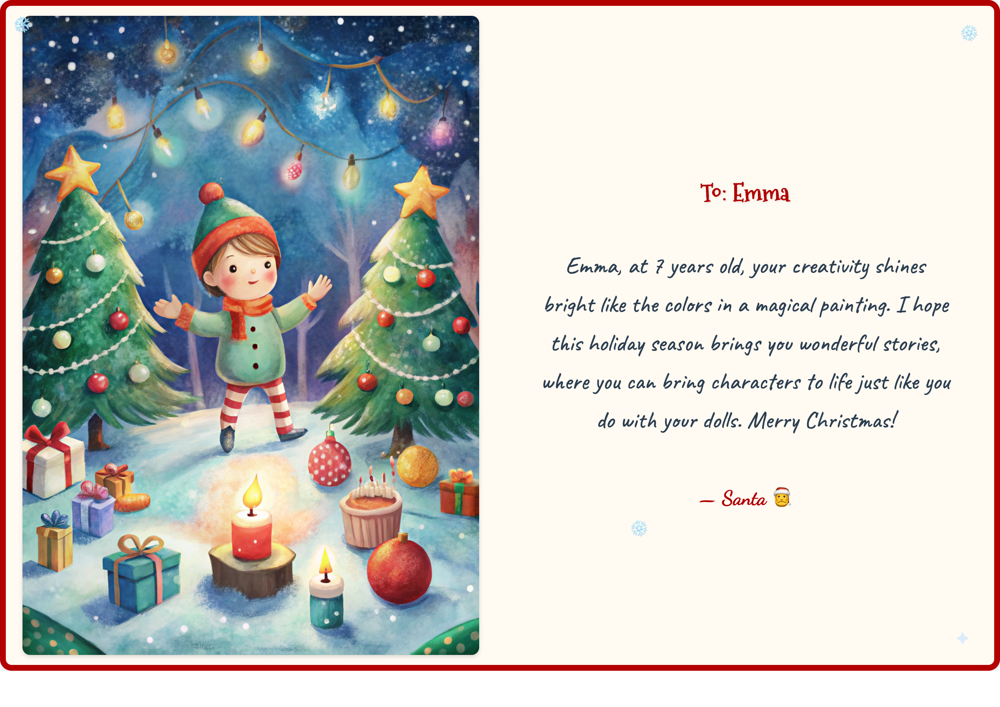


🎄 Creating PNG card for Lucas...
✅ PNG saved: prototype/cards/Lucas-88c20758-de57-4c84-91fc-015c9da411bd.png
✅ PNG card saved: prototype/cards/Lucas-88c20758-de57-4c84-91fc-015c9da411bd.png


3753582 bytes written to file /Users/mnrozhkov/dev/santa-scaline-challenge/prototype/Lucas-88c20758-de57-4c84-91fc-015c9da411bd.png


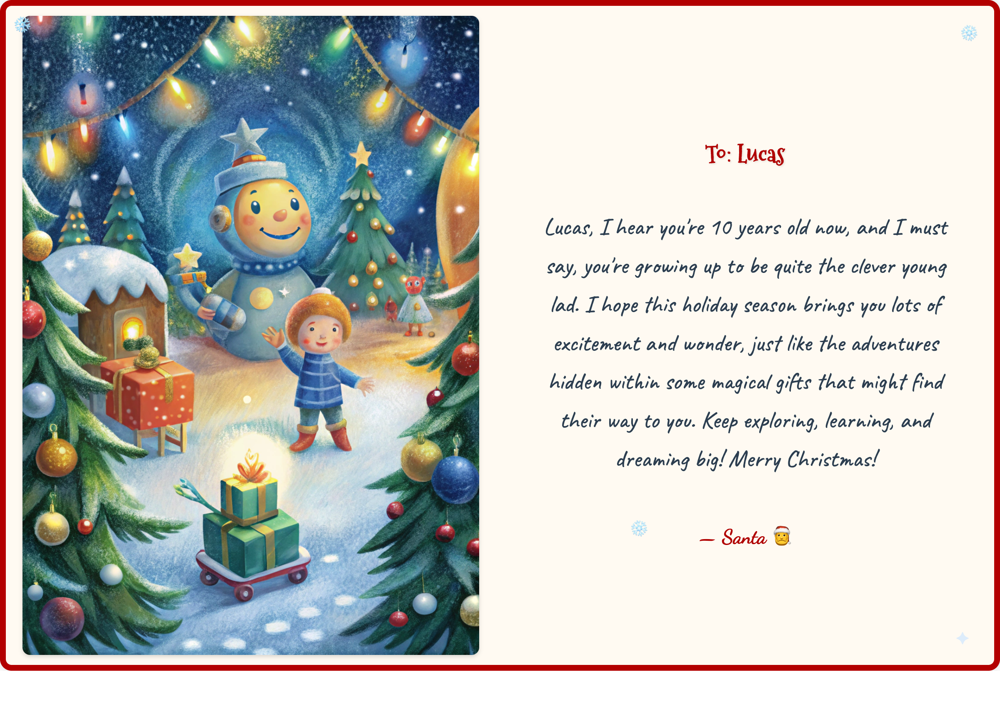


🎄 Creating PNG card for Sophia...
✅ PNG saved: prototype/cards/Sophia-367c81c9-2b1d-4a12-ae7b-d2a63d3ba22b.png
✅ PNG card saved: prototype/cards/Sophia-367c81c9-2b1d-4a12-ae7b-d2a63d3ba22b.png


3544453 bytes written to file /Users/mnrozhkov/dev/santa-scaline-challenge/prototype/Sophia-367c81c9-2b1d-4a12-ae7b-d2a63d3ba22b.png


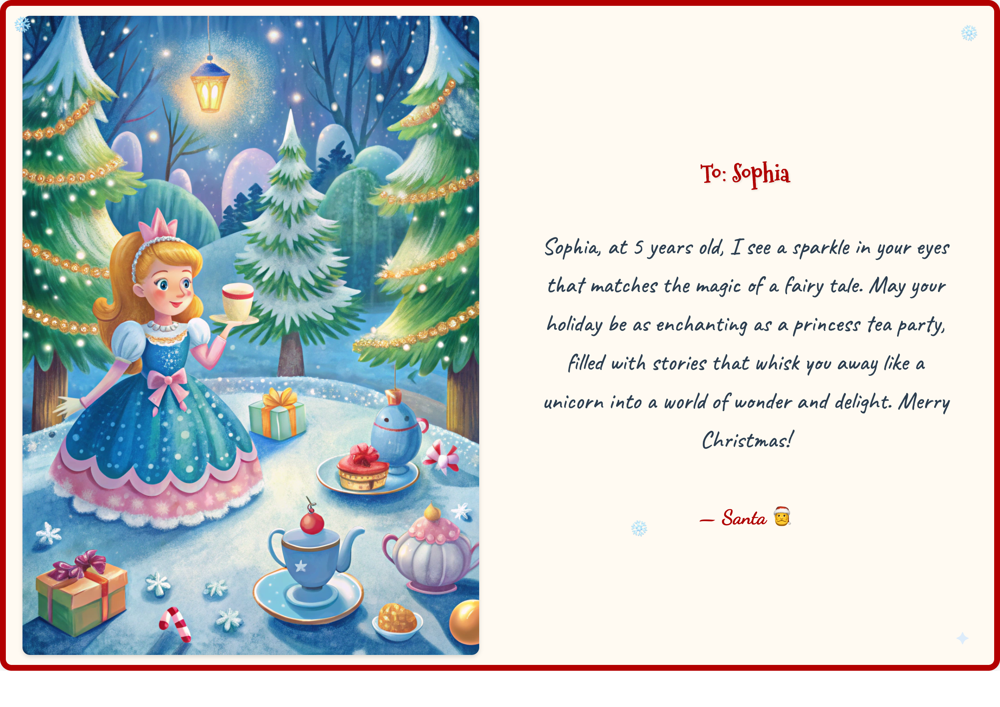


🎄 Creating PNG card for Noah...
✅ PNG saved: prototype/cards/Noah-3c821568-5dd6-4ea1-a9c3-a6aa4f52fa8d.png
✅ PNG card saved: prototype/cards/Noah-3c821568-5dd6-4ea1-a9c3-a6aa4f52fa8d.png


3545850 bytes written to file /Users/mnrozhkov/dev/santa-scaline-challenge/prototype/Noah-3c821568-5dd6-4ea1-a9c3-a6aa4f52fa8d.png


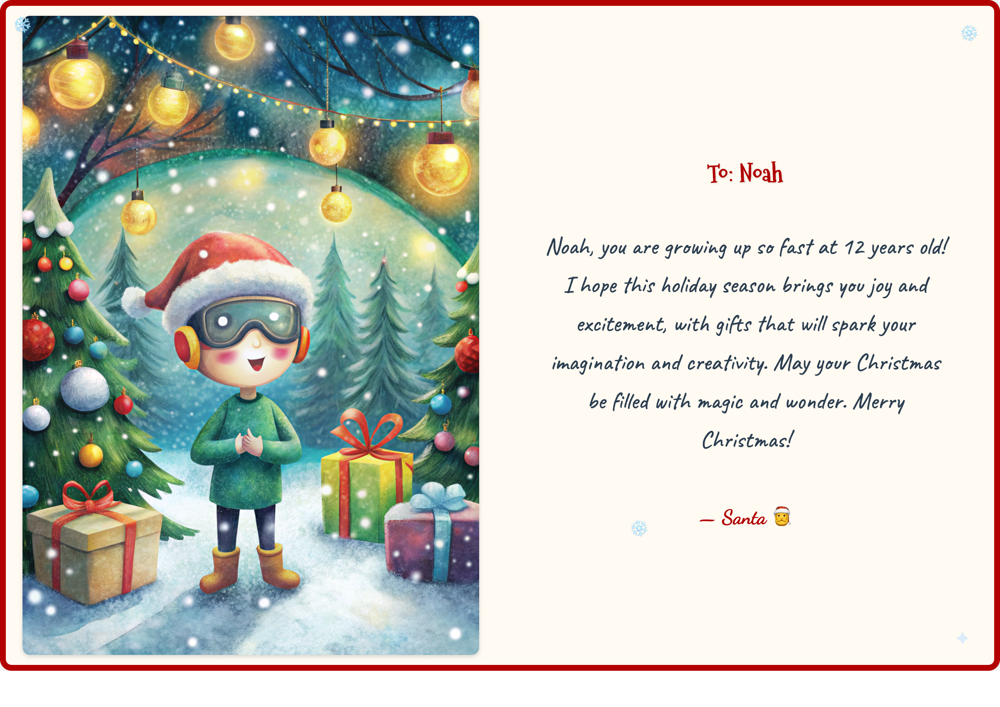


📊 Created 4 PNG cards


In [ ]:
# Format all gift cards as PNG images
formatted_cards = []

for kid, recommendation, wish, image in zip(sample_kids, recommendations, wishes, images):
    print(f"\n🎄 Creating PNG card for {kid.name}...")
    try:
        # Create complete gift card (saves as PNG)
        gift_card = create_complete_gift_card(
            kid_profile=kid,
            gift_recommendation=recommendation,
            wish=wish,
            card_image=image,
            output_dir="prototype/cards",
            width=2400,  # Card width in pixels
            height=1697,  # Card height in pixels
        )
        formatted_cards.append(gift_card)

        print(f"✅ PNG card saved: {gift_card.rendered_url}")

        # Display PNG in notebook (not HTML)
        if IPYTHON_AVAILABLE:
            from IPython.display import Image as IPImage

            display(IPImage(filename=gift_card.rendered_url, width=600))

    except Exception as e:
        print(f"❌ Error creating PNG card: {str(e)}")

print(f"\n📊 Created {len(formatted_cards)} PNG cards")